Adapted from [Image Processing Cookbook](https://github.com/PacktPublishing/Python-Image-Processing-Cookbook) and [Hands On Image Processing with Python](https://github.com/PacktPublishing/Hands-On-Image-Processing-with-Python)

In [0]:
!apt-get -qq install -y libsm6 libxext6
!pip install imgaug==0.2.7
!pip install opencv-python==3.4.2.16
!pip install opencv-contrib-python==3.4.2.16

     |████████████████████████████████| 645kB 2.2MB/s 
ERROR: albumentations 0.1.12 has requirement imgaug<0.2.7,>=0.2.5, but you'll have imgaug 0.2.7 which is incompatible.
  Found existing installation: imgaug 0.2.9
    Uninstalling imgaug-0.2.9:
      Successfully uninstalled imgaug-0.2.9


In [0]:
import cv2
print(cv2.__version__)
# 3.4.2
import numpy as np
import glob
import matplotlib.pylab as plt
from collections import defaultdict

3.3.0


In [0]:
!git clone https://github.com/PacktPublishing/Python-Image-Processing-Cookbook.git

fatal: destination path 'Python-Image-Processing-Cookbook' already exists and is not an empty directory.


In [0]:
IMAGE_DIR = '/content/Python-Image-Processing-Cookbook/Chapter 05/images/'

In [0]:
print(IMAGE_DIR + "query.png")

/content/Python-Image-Processing-Cookbook/Chapter 05/images/query.png


Image file = /content/Python-Image-Processing-Cookbook/Chapter 05/images/search/victoria_left_part.png, Number of good matches = 102
Image file = /content/Python-Image-Processing-Cookbook/Chapter 05/images/search/victoria_colored2.png, Number of good matches = 316


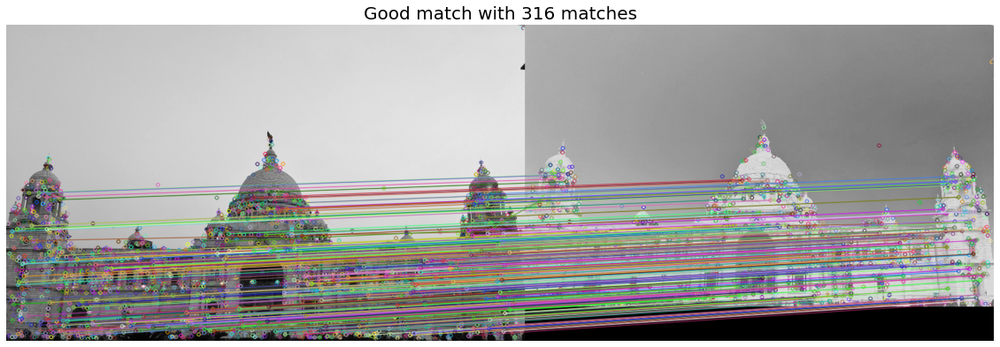

Image file = /content/Python-Image-Processing-Cookbook/Chapter 05/images/search/victoria_back_night.png, Number of good matches = 17
Image file = /content/Python-Image-Processing-Cookbook/Chapter 05/images/search/victoria_night.png, Number of good matches = 12
Image file = /content/Python-Image-Processing-Cookbook/Chapter 05/images/search/victoria_XDOG.png, Number of good matches = 41
Image file = /content/Python-Image-Processing-Cookbook/Chapter 05/images/search/victoria_back.png, Number of good matches = 30
Image file = /content/Python-Image-Processing-Cookbook/Chapter 05/images/search/victoria_stylized_1.png, Number of good matches = 46
Image file = /content/Python-Image-Processing-Cookbook/Chapter 05/images/search/victoria_cartoonized.png, Number of good matches = 53
Image file = /content/Python-Image-Processing-Cookbook/Chapter 05/images/search/victoria_gray.png, Number of good matches = 993


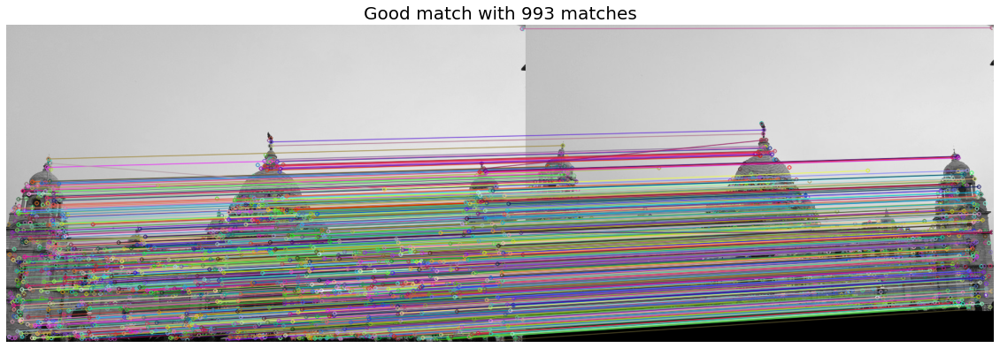

Image file = /content/Python-Image-Processing-Cookbook/Chapter 05/images/search/victoria_stylized_2.png, Number of good matches = 17
Image file = /content/Python-Image-Processing-Cookbook/Chapter 05/images/search/victoria_noisy.png, Number of good matches = 150
Image file = /content/Python-Image-Processing-Cookbook/Chapter 05/images/search/victoria_color_pencil.png, Number of good matches = 4


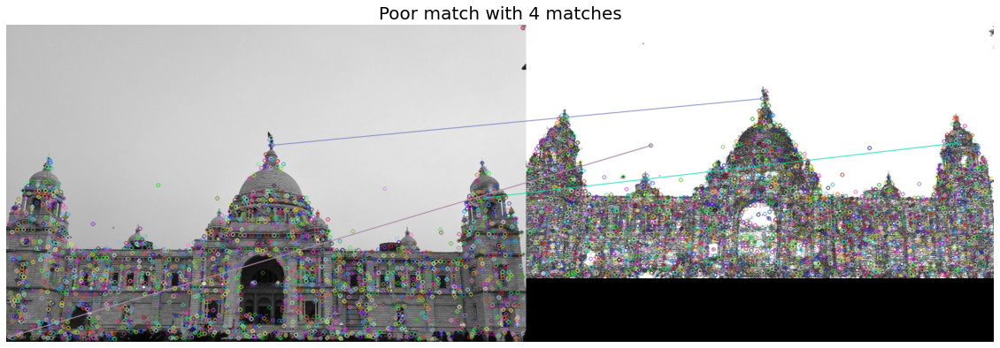

Image file = /content/Python-Image-Processing-Cookbook/Chapter 05/images/search/victoria_stained_glass.png, Number of good matches = 15
Image file = /content/Python-Image-Processing-Cookbook/Chapter 05/images/search/victoria_DOG.png, Number of good matches = 35
Image file = /content/Python-Image-Processing-Cookbook/Chapter 05/images/search/victoria_colored.png, Number of good matches = 808


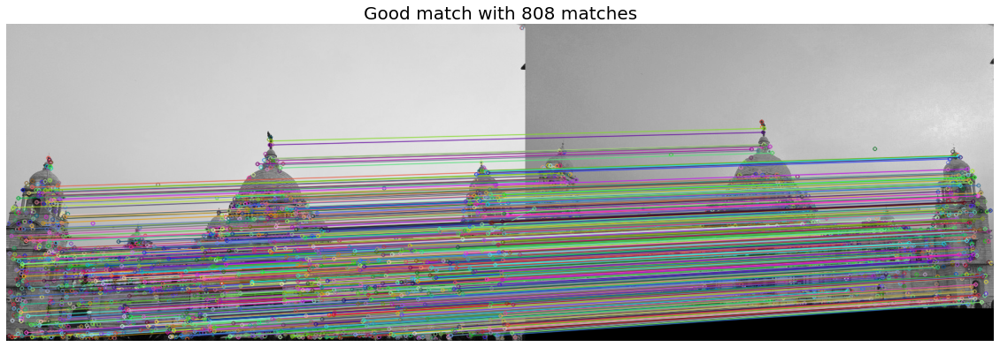

Image file = /content/Python-Image-Processing-Cookbook/Chapter 05/images/search/rabindrasadan.png, Number of good matches = 4


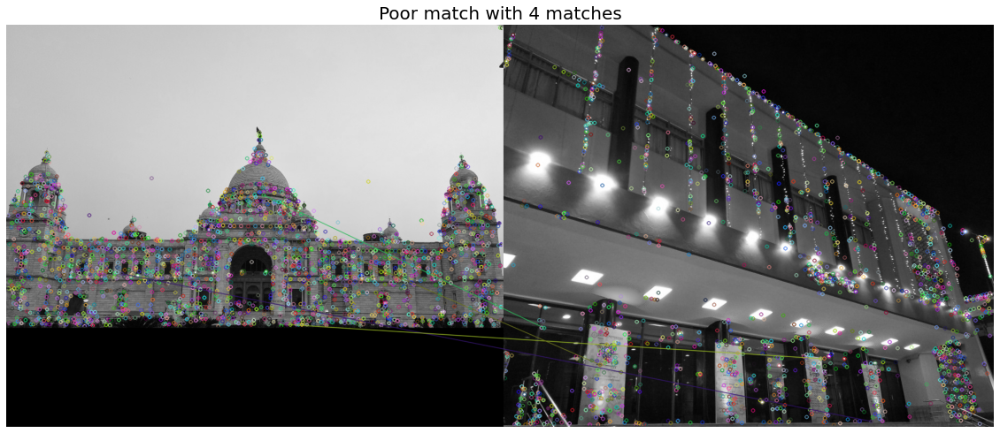

Image file = /content/Python-Image-Processing-Cookbook/Chapter 05/images/search/victoria_histeq.png, Number of good matches = 584


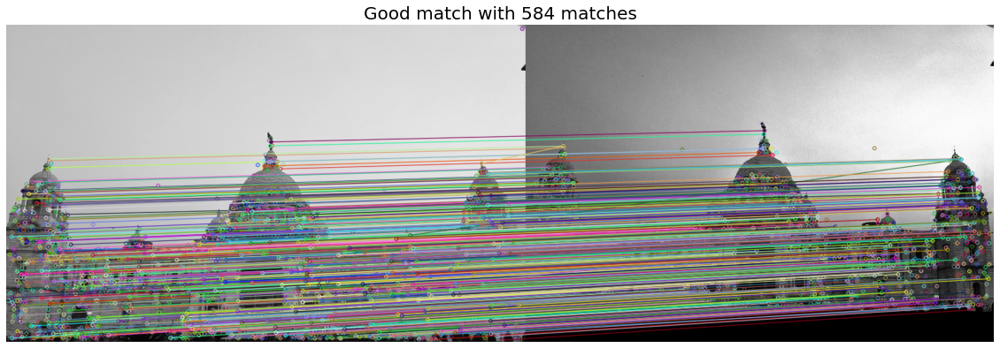

Image file = /content/Python-Image-Processing-Cookbook/Chapter 05/images/search/victoria_adapt_histeq.png, Number of good matches = 505


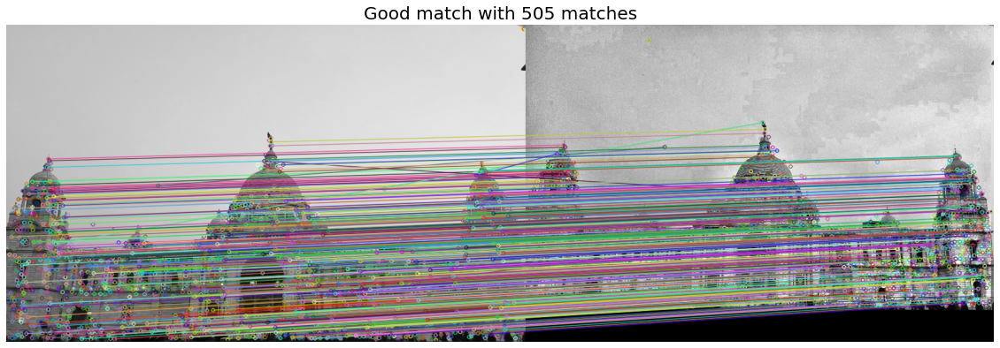

Image file = /content/Python-Image-Processing-Cookbook/Chapter 05/images/search/victoria_night_blurred_ocluded.png, Number of good matches = 9


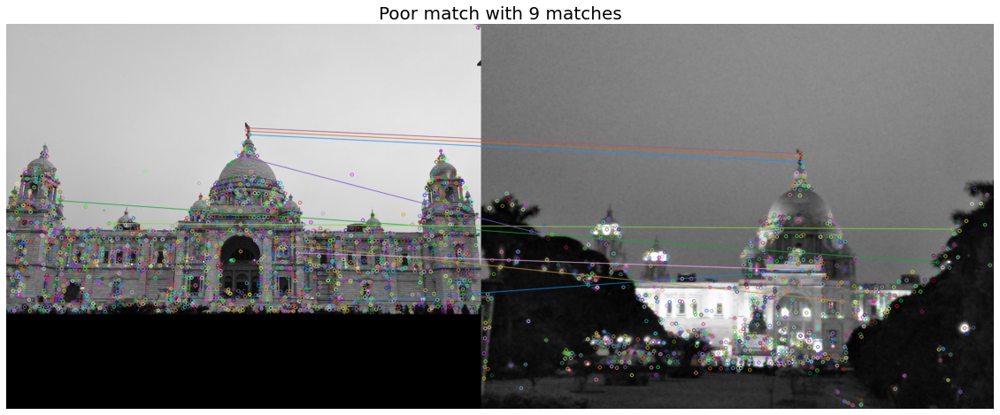

Image file = /content/Python-Image-Processing-Cookbook/Chapter 05/images/search/victoria_dodge.png, Number of good matches = 107
Image file = /content/Python-Image-Processing-Cookbook/Chapter 05/images/search/nandan.png, Number of good matches = 3


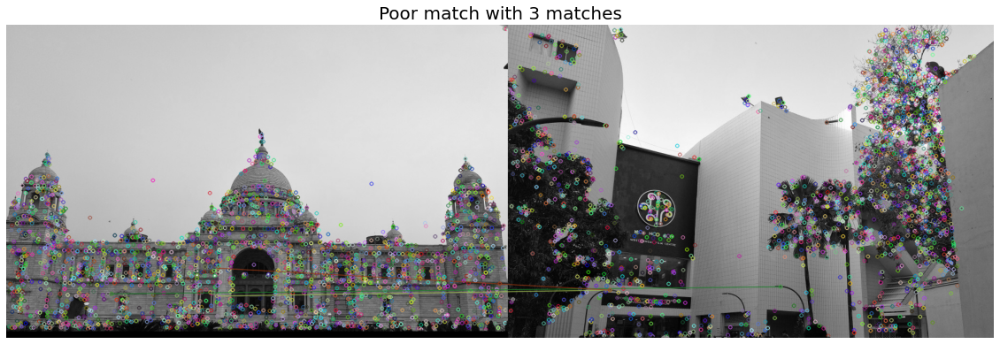

Image file = /content/Python-Image-Processing-Cookbook/Chapter 05/images/search/victoria_stylized_3.png, Number of good matches = 31
Image file = /content/Python-Image-Processing-Cookbook/Chapter 05/images/search/victoria_sharpened.png, Number of good matches = 42
Image file = /content/Python-Image-Processing-Cookbook/Chapter 05/images/search/victoria_oilpaint.png, Number of good matches = 66
Image file = /content/Python-Image-Processing-Cookbook/Chapter 05/images/search/victoria_water_color.png, Number of good matches = 20
Image file = /content/Python-Image-Processing-Cookbook/Chapter 05/images/search/victoria_embossed.png, Number of good matches = 35
Image file = /content/Python-Image-Processing-Cookbook/Chapter 05/images/search/victoria_pencil.png, Number of good matches = 5


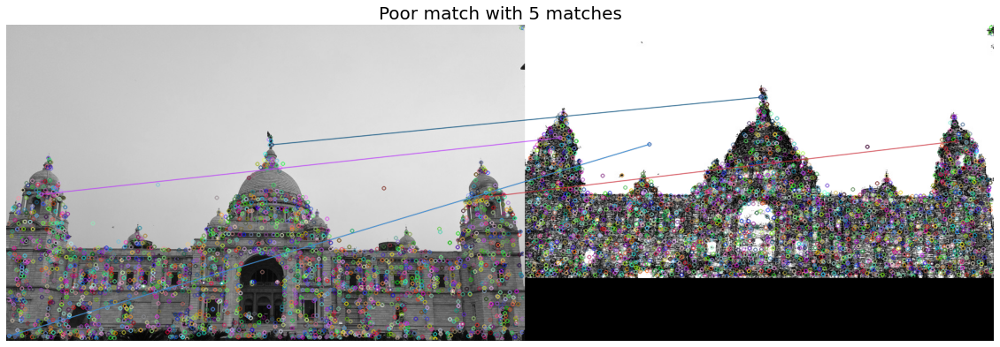

Image file = /content/Python-Image-Processing-Cookbook/Chapter 05/images/search/victoria_zoomed.png, Number of good matches = 382


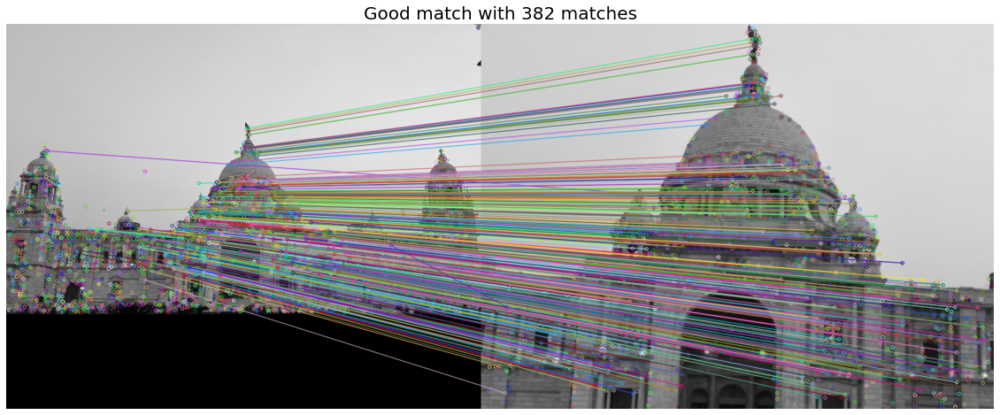

Image file = /content/Python-Image-Processing-Cookbook/Chapter 05/images/search/victoria_rotated.png, Number of good matches = 384


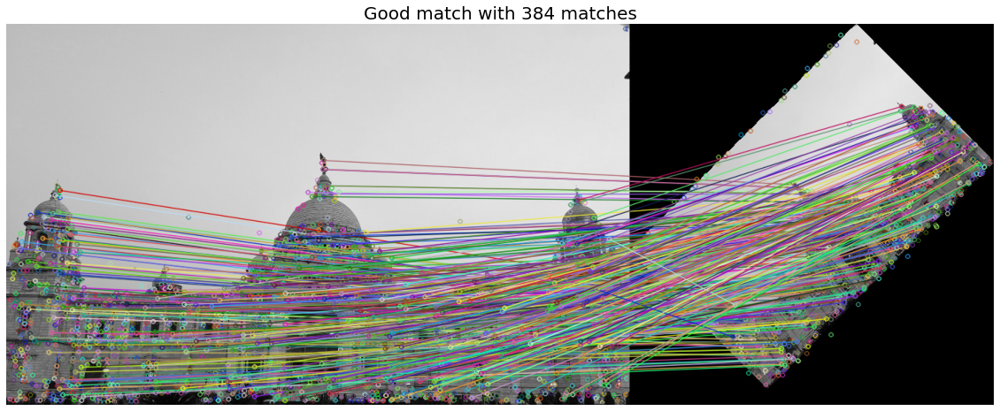

Image file = /content/Python-Image-Processing-Cookbook/Chapter 05/images/search/victoria_resized.png, Number of good matches = 93
Image file = /content/Python-Image-Processing-Cookbook/Chapter 05/images/search/victoria_right_part.png, Number of good matches = 106
Image file = /content/Python-Image-Processing-Cookbook/Chapter 05/images/search/lake.png, Number of good matches = 3


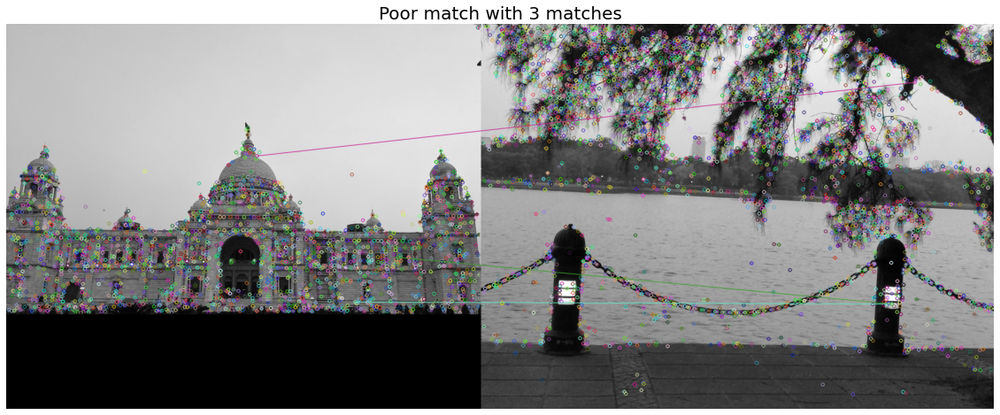

Image file = /content/Python-Image-Processing-Cookbook/Chapter 05/images/search/victoria_motion_blurred.png, Number of good matches = 38
Image file = /content/Python-Image-Processing-Cookbook/Chapter 05/images/search/victoria_aniso.png, Number of good matches = 11
Image file = /content/Python-Image-Processing-Cookbook/Chapter 05/images/search/victoria_perspective.png, Number of good matches = 135
Image file = /content/Python-Image-Processing-Cookbook/Chapter 05/images/search/victoria_with_lake.png, Number of good matches = 42
Image file = /content/Python-Image-Processing-Cookbook/Chapter 05/images/search/victoria_dodge2.png, Number of good matches = 22
Image file = /content/Python-Image-Processing-Cookbook/Chapter 05/images/search/victoria_middle.png, Number of good matches = 61
Image file = /content/Python-Image-Processing-Cookbook/Chapter 05/images/search/victoria.png, Number of good matches = 17


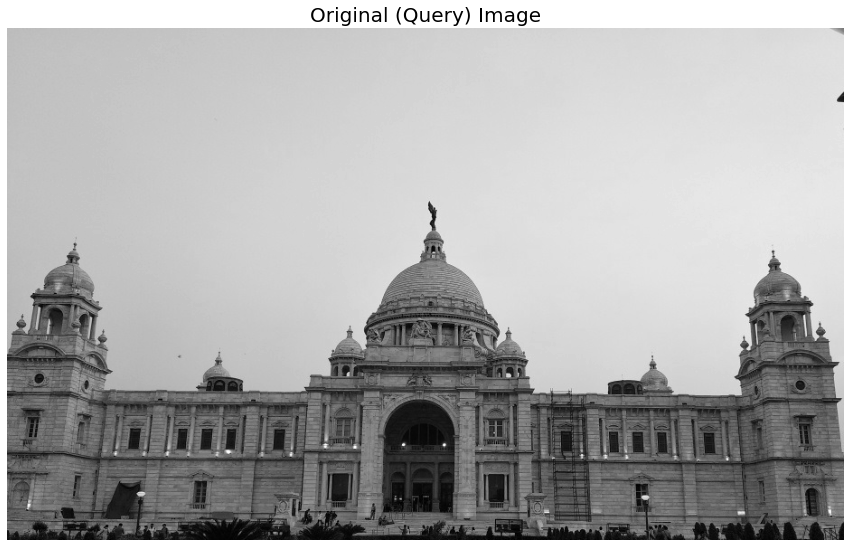

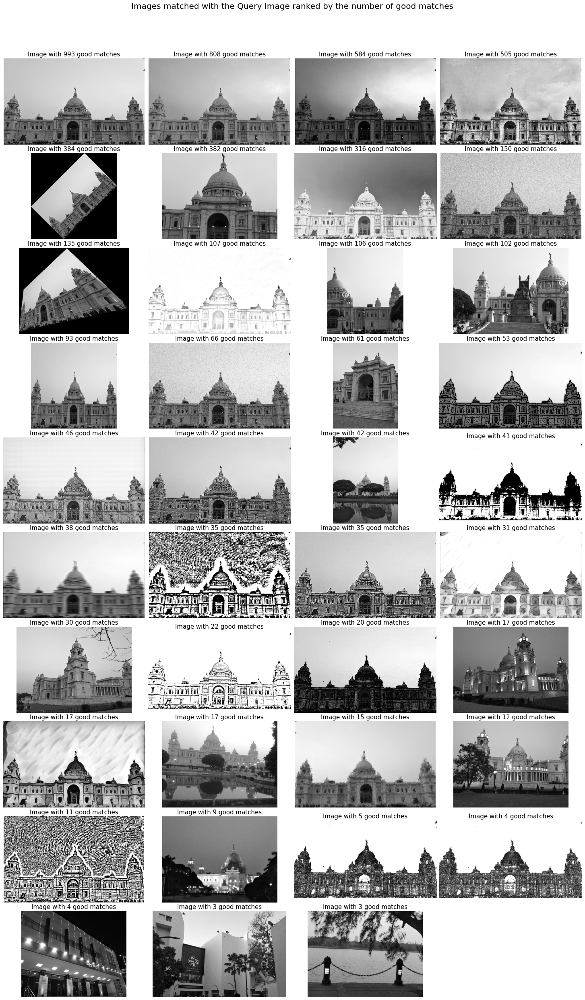

In [0]:
query = cv2.imread(IMAGE_DIR + "query.png", cv2.CV_8U)

matched_images = defaultdict(list)
for image_file in glob.glob(IMAGE_DIR + 'search/*.png'):
    
    search_image = cv2.imread(image_file, cv2.CV_8U)
    sift = cv2.xfeatures2d.SIFT_create()
    kp_1, desc_1 = sift.detectAndCompute(query, None)
    kp_2, desc_2 = sift.detectAndCompute(search_image, None)
    index_params = dict(algorithm=0, trees=5)
    search_params = dict()
    flann = cv2.FlannBasedMatcher(index_params, search_params)
    matches = flann.knnMatch(desc_1, desc_2, k=2)
    good_points = []
    ratio = 0.6
    for m, n in matches:
        if m.distance < ratio*n.distance:
            good_points.append(m)
    num_good_points = len(good_points)
    print('Image file = {}, Number of good matches = {}'.format(image_file, num_good_points))
    if (num_good_points > 300) or (num_good_points < 10):
        result = cv2.drawMatches(query, kp_1, search_image, kp_2, good_points, None)
        plt.figure(figsize=(20,10))
        plt.imshow(cv2.cvtColor(result, cv2.COLOR_BGR2RGB)), plt.axis('off')
        plt.title(('Good match' if num_good_points > 300 else 'Poor match') + ' with {} matches'.format(num_good_points), size=20)
        plt.show()

    matched_images[len(good_points)].append(search_image)

plt.figure(figsize=(15,10))
plt.gray()
plt.imshow(query), plt.axis('off')
plt.title('Original (Query) Image', size=20)
plt.show()

i = 1
plt.figure(figsize=(20,35))
plt.subplots_adjust(left=0, right=1, bottom=0, top=0.925, wspace=0.02, hspace=0.1)
for num_matches in sorted(matched_images, reverse=True):
    for image in matched_images[num_matches]:
        plt.subplot(10, 4, i)
        plt.imshow(image)
        plt.axis('off')
        plt.title('Image with {} good matches'.format(num_matches), size=15)
        i += 1
plt.suptitle('Images matched with the Query Image ranked by the number of good matches', size=20)
plt.show()

In [0]:
!pip install opencv-python==3.3.0.10 opencv-contrib-python==3.3.0.10

     |████████████████████████████████| 15.5MB 1.4MB/s 
     |████████████████████████████████| 21.4MB 1.5MB/s 
ERROR: dopamine-rl 1.0.5 has requirement opencv-python>=3.4.1.15, but you'll have opencv-python 3.3.0.10 which is incompatible.
ERROR: albumentations 0.1.12 has requirement imgaug<0.2.7,>=0.2.5, but you'll have imgaug 0.2.7 which is incompatible.
  Found existing installation: opencv-python 3.4.2.16
    Uninstalling opencv-python-3.4.2.16:
      Successfully uninstalled opencv-python-3.4.2.16
  Found existing installation: opencv-contrib-python 3.4.2.16
    Uninstalling opencv-contrib-python-3.4.2.16:
      Successfully uninstalled opencv-contrib-python-3.4.2.16


In [0]:
!git clone https://github.com/PacktPublishing/Hands-On-Image-Processing-with-Python.git

Cloning into 'Hands-On-Image-Processing-with-Python'...
remote: Enumerating objects: 6, done.
remote: Counting objects: 100% (6/6), done.
remote: Compressing objects: 100% (6/6), done.
remote: Total 725 (delta 1), reused 1 (delta 0), pack-reused 719
Receiving objects: 100% (725/725), 237.23 MiB | 31.76 MiB/s, done.
Resolving deltas: 100% (146/146), done.
Checking out files: 100% (182/182), done.


In [0]:
IMAGE_DIR = '/content/Hands-On-Image-Processing-with-Python/images/'

In [0]:
from google.colab.patches import cv2_imshow

3.3.0


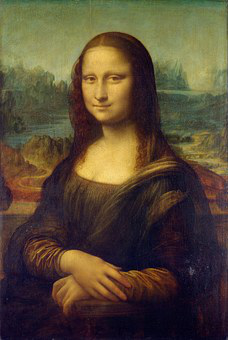

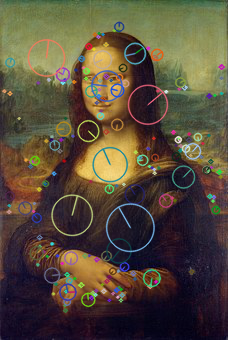

In [0]:
# make sure the opencv version is 3.3.0 with

import cv2
print(cv2.__version__)
# 3.3.0

img = cv2.imread(IMAGE_DIR + 'monalisa.jpg')
gray= cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)

cv2_imshow(img)

sift = cv2.xfeatures2d.SIFT_create()
kp = sift.detect(gray,None) # detect SIFT keypoints
 
img = cv2.drawKeypoints(img,kp, None, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
cv2_imshow(img);
#cv2.imwrite('me5_keypoints.jpg',img)

kp, des = sift.detectAndCompute(gray,None) # compute the SIFT descriptor